# Wizeline Technical Test

Sharon Lizzet Trejo Luna

In [1]:
# import libraries

# Data handling
import pandas as pd
import numpy as np

# Plotting
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
# import altair as alt

# Modeling
import xgboost as xgb
import optuna
import shap
from sklearn.model_selection import cross_val_score

# Preprocesing 
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# MEtrics
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, root_mean_squared_error

# System
import sys
import os
import warnings
import time
warnings.filterwarnings('ignore')

In [2]:
MAIN_DIR = os.path.abspath(os.curdir)
DATA_DIR = os.path.join(MAIN_DIR, 'data')
TRAIN_PATH = os.path.join(DATA_DIR, 'training_data.csv')
TEST_PATH = os.path.join(DATA_DIR, 'blind_test_data.csv')

In [41]:
sys.path.append(MAIN_DIR)

from funcs import *

In [3]:
# read data 
train = pd.read_csv(TRAIN_PATH)

# glimpse the structure of the data
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   feature_0   800 non-null    float64
 1   feature_1   800 non-null    float64
 2   feature_2   800 non-null    float64
 3   feature_3   800 non-null    float64
 4   feature_4   800 non-null    float64
 5   feature_5   800 non-null    float64
 6   feature_6   800 non-null    float64
 7   feature_7   800 non-null    float64
 8   feature_8   800 non-null    float64
 9   feature_9   800 non-null    float64
 10  feature_10  800 non-null    float64
 11  feature_11  800 non-null    float64
 12  feature_12  800 non-null    float64
 13  feature_13  800 non-null    float64
 14  feature_14  800 non-null    float64
 15  feature_15  800 non-null    float64
 16  feature_16  800 non-null    float64
 17  feature_17  800 non-null    float64
 18  feature_18  800 non-null    float64
 19  feature_19  800 non-null    f

In [4]:
train.drop_duplicates().shape

(800, 21)

The data has 20 numerical features. None have NA data, so we can skip the NA analysis where we make an strategy on how to handle them.
Also, the data doesn't include duplicated values.

First, lets see some descriptive statistics in order to get a better ideo on the distribution of the features

The dimensionality of the data is small, soo no dimensionality reduction step is indispensable.

In [5]:
train.describe()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,target
count,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,...,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000
mean,468.181612,301.960218,317.132996,283.213456,485.975950,320.953859,217.136330,387.196289,179.485453,196.003058,...,3.372667,479.841915,100.112096,28.334725,277.205999,91.217615,70.927129,27.385266,457.016407,14.631342
std,270.797415,170.691136,176.501920,157.698215,272.594030,185.157189,123.660691,235.131376,104.059309,111.042671,...,1.986369,276.304197,59.149794,16.105155,167.385930,53.950523,40.588905,15.509062,270.650146,5.089503
min,0.916648,0.800119,0.173025,0.308823,0.598527,0.997347,0.402436,0.474825,0.727850,0.264253,...,0.004464,1.706240,0.194306,0.222312,1.726915,0.093789,0.072986,0.101761,0.252919,0.279805
25%,239.330140,157.338244,167.516318,151.302826,250.305362,158.374610,106.876625,195.037853,94.220273,95.052359,...,1.630150,249.560260,48.132939,14.660437,131.516567,44.357970,34.903031,13.815298,221.270792,10.879914
50%,477.750620,303.257176,326.310194,294.574403,493.470486,328.722464,217.098090,364.124238,173.364771,199.587048,...,3.349497,468.536888,100.247827,27.953146,275.950814,87.484343,74.429675,27.766111,462.153497,14.687955
75%,704.650292,448.878174,474.484472,415.806162,720.747672,480.076559,327.411334,588.565017,268.790459,291.546642,...,5.024192,713.291136,149.966755,42.514155,423.110446,137.888018,105.484961,40.402938,688.352373,18.224713
max,940.771543,595.359858,614.271632,549.896216,950.017444,638.199832,426.308251,809.346792,367.084755,384.919108,...,6.859269,979.715063,203.122292,56.467485,566.611509,187.041256,138.675389,53.254740,935.740775,27.360789


# Distributions

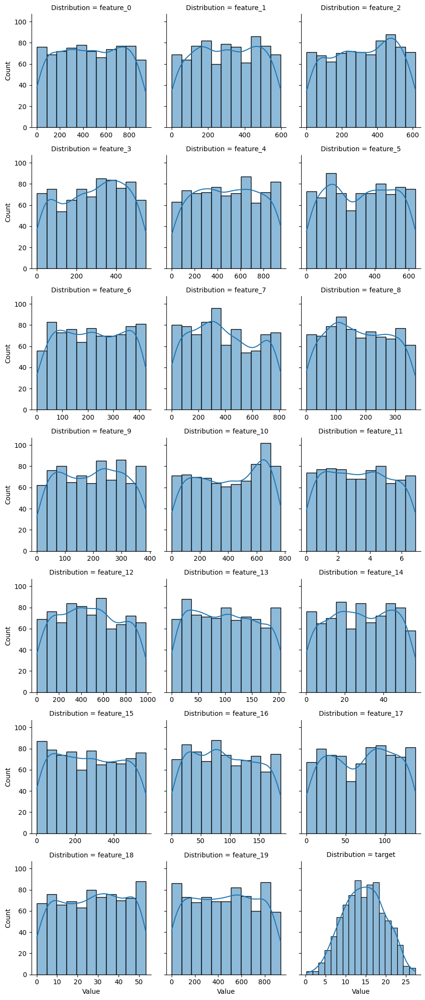

In [6]:

melted_data = train.melt(var_name='Distribution', value_name='Value')
g = sns.FacetGrid(melted_data, col='Distribution', col_wrap=3, sharex=False)
g.map_dataframe(sns.histplot, x='Value', kde=True)
sns.despine()


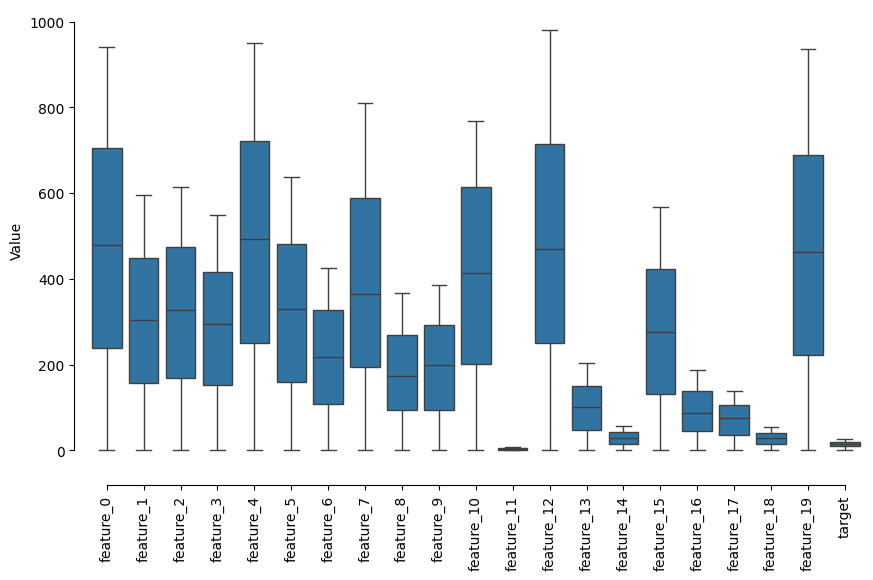

In [7]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="Distribution", y="Value",
            data=melted_data)
plt.xlabel('')
sns.despine(offset=10, trim=True)
plt.xticks(rotation=90)

plt.show()

The features show a con siderable variance across their range, we could tell from the mean differeing gretly from the median, and their distribution plot being a bit flatt.


The distribution appears to be relatively uniform across the middle range, with some drop-off at the extremes. 
Althoug we have some features that display bimodal characteristics such as feature 17 or 5.
Feature 3 has a left skewed distribution and also displays a bimodal behaviour. 

Feaures 11 and 14, take smaller values, for feature 11 the max being less than 10 and f14 less than 60. This indicates normalization/scaling will be important for modeling, to avoid features with greater scales having greater weights

The target variable more or less follows a normal distribution. 
The features don't have outliers.


# Correlation Analysis

<Figure size 2000x2000 with 0 Axes>

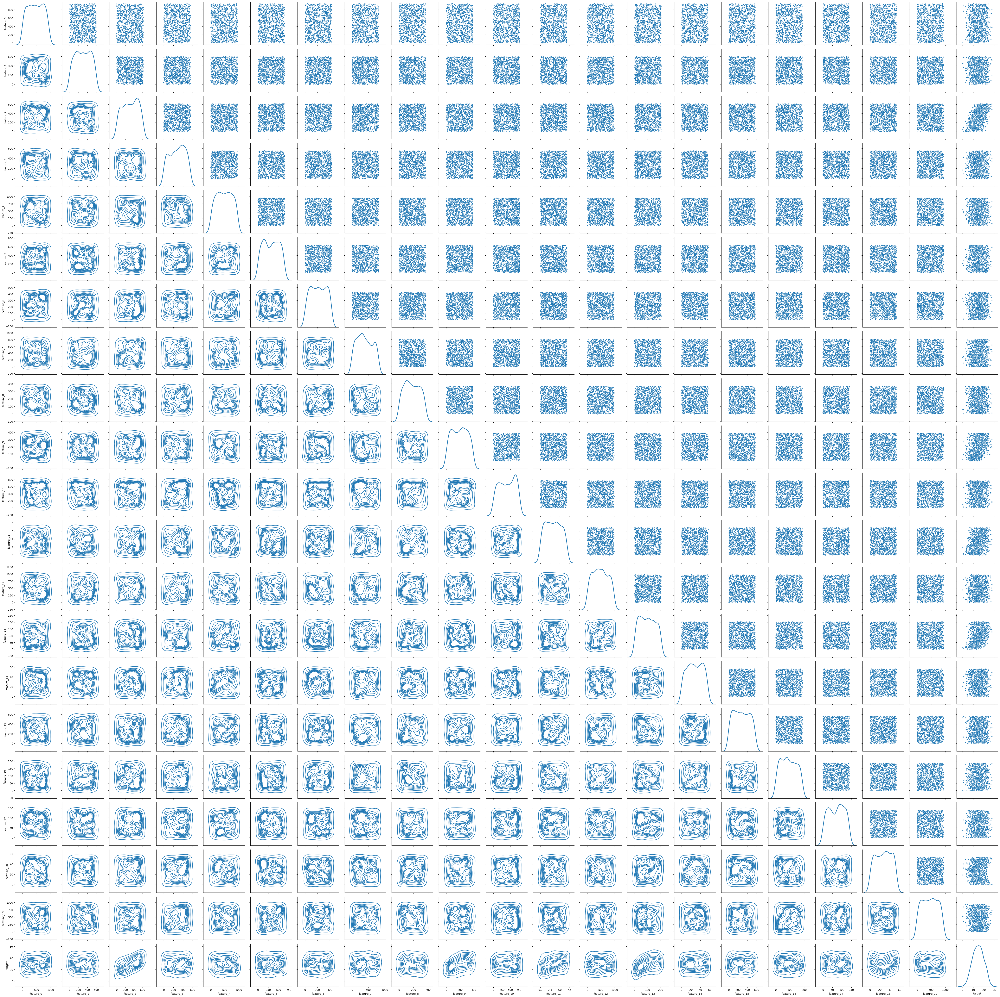

In [8]:
plt.figure(figsize=(20,20))
g = sns.PairGrid(train, diag_sharey=False)
g.map_upper(sns.scatterplot, s=15) # for linear relations
g.map_lower(sns.kdeplot) # for non linear relations
g.map_diag(sns.kdeplot, lw=2) # for variable distribution

plt.show()

The variables generally don't exhibit strong linear relationships, and while some pairs may have weak non-linear associations or clustering patterns, many variables appear to have no clear functional relationship with each other.

FEature 2 and Traget seem to have a stronger linear relation, compared to the other variables.

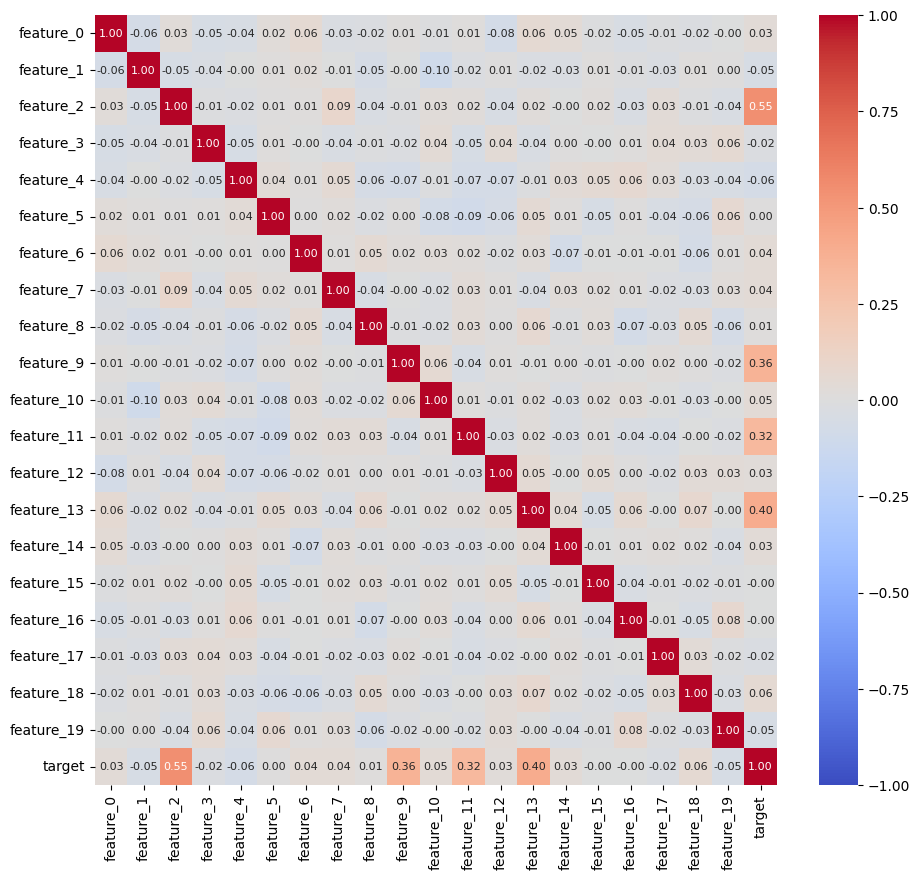

In [9]:
# correlogram
plt.figure(figsize=(11, 10))
sns.heatmap(train.corr(), cmap='coolwarm', annot=True, fmt=".2f",vmin=-1, vmax=1, annot_kws={"size": 8})
plt.show()

The correlogram below confirs thtat the linear relations are weak. And Target with feature 2 have the higher linear correlation. 

## PCA 

A PCA is performed in order to understand better the behaviour of the features. It can help to identify if there's significant redundancy in the variables. 
Also, it might uncover hidden patterns that aren't visible in pairwise comparisons.

In [10]:
scaler = StandardScaler()
X = train.drop(columns=['target'])
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

print('Explained variance ratio:', pca.explained_variance_ratio_.sum())


Explained variance ratio: 0.12603456969003365


In [11]:
# biplot

loadings = pca.components_
n_features = pca.n_features_in_
feature_names = X.columns
 
pc_list = [f'PC{i}' for i in list(range(1, n_features + 1))]
pc_loadings = dict(zip(pc_list, loadings))
loadings_df = pd.DataFrame.from_dict(pc_loadings)
loadings_df['feature_names'] = feature_names
loadings_df = loadings_df.set_index('feature_names')

xs = loadings[0]
ys = loadings[1]

pca_df = pd.DataFrame(
    data=X_pca, 
    columns=['PC1', 'PC2'])

pca_df_scaled = pca_df.copy()

# Scale components to be between -1 and 1
scaler_df = pca_df[['PC1', 'PC2']]
scaler = 1 / (scaler_df.max() - scaler_df.min())
 
for index in scaler.index:
    pca_df_scaled[index] *= scaler[index]


<Figure size 1000x1000 with 0 Axes>

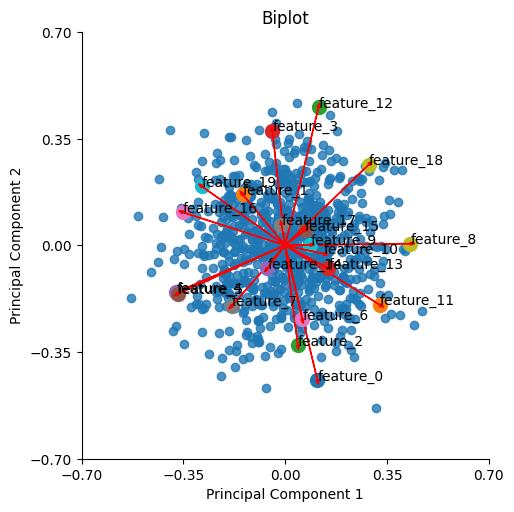

In [12]:
plt.figure(figsize=(10, 10))

sns.lmplot(
    x='PC1', 
    y='PC2', 
    data=pca_df_scaled, 
    fit_reg=False, 
    )
 
for i, varnames in enumerate(feature_names):
    plt.scatter(xs[i], ys[i], s=100)
    plt.arrow(
        0, 0, 
        xs[i],
        ys[i],
        color='r', 
        head_width=0.01
        )
    plt.text(xs[i], ys[i], varnames)
 
xticks = np.linspace(-0.7, 0.7, num=5)
yticks = np.linspace(-0.7, 0.7, num=5)
plt.xticks(xticks)
plt.yticks(yticks)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
 
plt.title('Biplot')
plt.show()

No discernable clusters are formed. The even distribution of arrows around the origin suggests the features capture different aspects of the data

Although features 0 and 12 have the longest loading vectors, indicating they contribute most strongly to the explained variance in the data.
They are approximately pointing in opposite directions, suggesting a  negative correlation between these features.

# Modeling

As exploratory data analysis revealed non-linear relationships between features and the target variable, linear methods would be inadequate, systematically underfitting the data and missing crucial patterns. While neural networks could handle such non-linearities but they require larger datsets.
Therefore, XGBoost is selected as it can effectively model non-linear patterns while being well-suited for smaller datasets through its built-in regularization mechanisms.


# Hyperparameter Tunning
There are two main types of parametersfor XGBoost tree parameters and boosting parameters.
The main parameters we will focus on will be `max_depth`,`min_child_weight`,`reg_lambda`, `learning_rate`.

**Strategy**
A two-stage procedure where we first find optimal tree parameters, then we maximize performance. 

1. Tune tree parameters. Fix the learning rate at a relatively high value and enable early stopping so that each model trains within a few seconds.
2. Tune boosting parameters. Using these optimal tree parameter values, fix a low learning rate and train your model, using early stopping to identify the optimal number of boosting rounds.




In [13]:
# Split the data in validation and training

X = train.drop(columns=['target'])
y = train['target']

# Tried, but results were better without scalling
# scaler = StandardScaler()
# X_scaled = pd.DataFrame(data=scaler.fit_transform(X), columns=X.columns)

X_train, X_mid, y_train, y_mid = train_test_split(X, y, test_size=0.7, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_mid, y_mid, test_size=0.5, random_state=42)

# define kfold cross-validation
kf = KFold(n_splits=8, shuffle=True, random_state=42)


# Reformatting for xgb api
dtrain = xgb.DMatrix(data=X_train, label=y_train)
dvalid = xgb.DMatrix(data=X_valid, label=y_valid)

dtest = xgb.DMatrix(data=X_test, label=y_test)

dtrainvalid = xgb.DMatrix(data=pd.concat([X_train, X_valid]), 
                          label=pd.concat([y_train, y_valid]))

In [14]:
# Parameters to keep fixed 
metric = 'rmse' # can change to some other metric
base_params = {
    'objective': 'reg:squarederror',
    'eval_metric': metric,
}

For model evaluation, RMSE will be our primary metric, supplemented by MAE and adjusted R². While RMSE captures error magnitude and penalizes larger errors, MAE provides robustness against outliers, and adjusted R² helps assess model fit while accounting for complexity. This combination gives us a balanced view of model performance, especially given our non-linear feature relationships.

## stage 1: tune tree parameters

In [16]:
learning_rate = 0.3 # Fix a high learning rate

params = {
    'tree_method': 'approx',
    'learning_rate': learning_rate
}
params.update(base_params)
model = xgb.train(params=params, dtrain=dtrain,
                  evals=[(dtrain, 'train'), (dvalid, 'valid')],
                  num_boost_round=10000,
                  early_stopping_rounds=50, 
                  verbose_eval=0)


In [17]:
def objective(trial):
    params = {
        'tree_method': trial.suggest_categorical('tree_method', ['approx', 'hist']),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 250),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0),
        'colsample_bynode': trial.suggest_float('colsample_bynode', 0.1, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.001, 25, log=True),
        'learning_rate': learning_rate,
    }
    num_boost_round = 10000
    params.update(base_params)
    # prunning callback: allows optuna to terminate training on lousy models after few boosting rounds
    pruning_callback = optuna.integration.XGBoostPruningCallback(trial, f'test-{metric}') 
    # model = xgb.train(params=params, dtrain=dtrain, num_boost_round=num_boost_round,
    #                   evals=[(dtrain, 'train'), (dvalid, 'valid')],
    #                   early_stopping_rounds=50,
    #                   verbose_eval=0,
    #                   callbacks=[pruning_callback])

    # trial.set_user_attr('best_iteration', model.best_iteration)
    # return model.best_score
    
    # better use cv
    cv_results = xgb.cv(
        params=params,
        dtrain=dtrain,
        num_boost_round=num_boost_round,
        early_stopping_rounds=50,
        nfold=8, # 8 folds 
        callbacks=[pruning_callback],
    )

    best_score = cv_results[f'test-{metric}-mean'].min()
    best_iteration = len(cv_results)
    trial.set_user_attr('best_iteration', best_iteration)
    
    return best_score

In [18]:
# you could run:
# study = optuna.create_study(direction='minimize')
# study.optimize(objective, n_trials=50)
# It might take to long to run 50 trials, so i will set a time limit of 5 minutes.

sampler = optuna.samplers.TPESampler(seed=42)
study = optuna.create_study(direction='minimize', sampler=sampler)
tic = time.time()
while time.time() - tic < 300: # 5 minutes = 300 seconds
    study.optimize(objective, n_trials=1)

[I 2025-02-22 01:30:53,084] A new study created in memory with name: no-name-8e6ef49c-9035-4e40-bb2c-3534bda6174f
[I 2025-02-22 01:30:53,241] Trial 0 finished with value: 5.004113099161275 and parameters: {'tree_method': 'hist', 'max_depth': 10, 'min_child_weight': 150, 'subsample': 0.24041677639819287, 'colsample_bynode': 0.2403950683025824, 'reg_lambda': 0.001800728515054226}. Best is trial 0 with value: 5.004113099161275.
[I 2025-02-22 01:30:55,049] Trial 1 finished with value: 2.7814379026219154 and parameters: {'tree_method': 'approx', 'max_depth': 10, 'min_child_weight': 6, 'subsample': 0.9729188669457949, 'colsample_bynode': 0.8491983767203796, 'reg_lambda': 0.008587261143813469}. Best is trial 1 with value: 2.7814379026219154.
[I 2025-02-22 01:30:55,197] Trial 2 finished with value: 5.004113099161275 and parameters: {'tree_method': 'hist', 'max_depth': 6, 'min_child_weight': 132, 'subsample': 0.48875051677790415, 'colsample_bynode': 0.36210622617823773, 'reg_lambda': 0.49078618

In [19]:
# fit model with best hyperparameters

model_stage1 = xgb.train(
    params=study.best_params, 
    dtrain=dtrain, 
    num_boost_round=study.best_trial.user_attrs['best_iteration'],
    evals=[(dtrain, 'train'), (dvalid, 'valid')],
    early_stopping_rounds=50,
    verbose_eval=0
)


In [20]:
print('Stage 1 ==============================')
print(f'best RMSE score = {study.best_trial.value}')
print(f'best R2 score = {score_r2_model(model_stage1, dvalid)}')
print(f'best MAE score = {score_mae_model(model_stage1, dvalid)}')
print('boosting params ---------------------------')
print(f'fixed learning rate: {learning_rate}')
print(f'best boosting round: {study.best_trial.user_attrs["best_iteration"]}')
print('best tree params --------------------------')
for k, v in study.best_trial.params.items():
    print(k, ':', v)

Stage 1 ==============================
best RMSE score = 2.178373093370569
best R2 score = 0.8090933561325073
best MAE score = 1.8711442947387695
boosting params ---------------------------
fixed learning rate: 0.3
best boosting round: 72
best tree params --------------------------
tree_method : approx
max_depth : 11
min_child_weight : 25
subsample : 0.9293443806196305
colsample_bynode : 0.8735693534512483
reg_lambda : 2.854992779353214


# Stage 2: Boosting parameters

In [21]:
low_learning_rate = 0.0015 # lower  learning rate = better your performance + more boosting rounds needed.
params = {}
params.update(base_params) # base params
params.update(study.best_trial.params) # update with optimal tree params
params['learning_rate'] = low_learning_rate
model_stage2 = xgb.train(params=params, dtrain=dtrain, 
                         num_boost_round=25000,
                         evals=[(dtrain, 'train'), (dvalid, 'valid')],
                         early_stopping_rounds=50,
                         verbose_eval=0)


In [22]:
history = xgb.cv(
    params=params, dtrain=dtrain, 
    num_boost_round=25000, 
    early_stopping_rounds=50, 
    metrics={'rmse'},
    nfold=8, 
    verbose_eval=0
)

In [ ]:
mean_rmse = history["test-rmse-mean"].values[-1]

In [24]:
print('Stage 2 ==============================')
print(f'best RMSE score = {score_rmse_model(model_stage2, dvalid)}')
print('Best CV RMSE score:', mean_rmse)
print(f'best R2 score = {score_r2_model(model_stage2, dvalid)}')
print(f'best MAE score = {score_mae_model(model_stage2, dvalid)}')
print('boosting params ---------------------------')
print(f'fixed learning rate: {params["learning_rate"]}')
print(f'best boosting round: {model_stage2.best_iteration}')

Stage 2 ==============================
best RMSE score = 2.146756172180176
Best CV RMSE score: 2.2303538741828013
best R2 score = 0.8331577181816101
best MAE score = 1.7470219135284424
boosting params ---------------------------
fixed learning rate: 0.0015
best boosting round: 10738


## Final Model

In [25]:
model_final = xgb.train(params=params, dtrain=dtrainvalid,  # Trained on both validation and training data
                        num_boost_round=model_stage2.best_iteration,
                        verbose_eval=0)

In [26]:
print('Final Model ==========================')
print(f'test RMSE score = {score_rmse_model(model_final, dtest)}')
print(f'test R2 score = {score_r2_model(model_final, dtest)}')
print(f'test MAE score = {score_mae_model(model_final, dtest)}')
print('parameters ---------------------------')
for k, v in params.items():
    print(k, ':', v)
print(f'num_boost_round: {model_stage2.best_iteration}')

Final Model ==========================
test RMSE score = 2.0977702140808105
test R2 score = 0.8225040435791016
test MAE score = 1.621221899986267
parameters ---------------------------
objective : reg:squarederror
eval_metric : rmse
tree_method : approx
max_depth : 11
min_child_weight : 25
subsample : 0.9293443806196305
colsample_bynode : 0.8735693534512483
reg_lambda : 2.854992779353214
learning_rate : 0.0015
num_boost_round: 10738


The R2 is lower than the 0.92 threshold for the test data

# Feature Importance (using SHAP)

In [28]:
# display df
feature_names = dtrain.feature_names
X_trainvalid_values = dtrainvalid.get_data().toarray()
X_display = pd.DataFrame(X_trainvalid_values, columns=feature_names)

In [ ]:
# Model interpretability with SHAP
explainer = shap.TreeExplainer(model_final)
shap_values = explainer.shap_values(X_display)


SHAP shows the contribution or the importance of each feature on the prediction of the model. The plot below, display the variables with the most importance for the model according to Shap values.

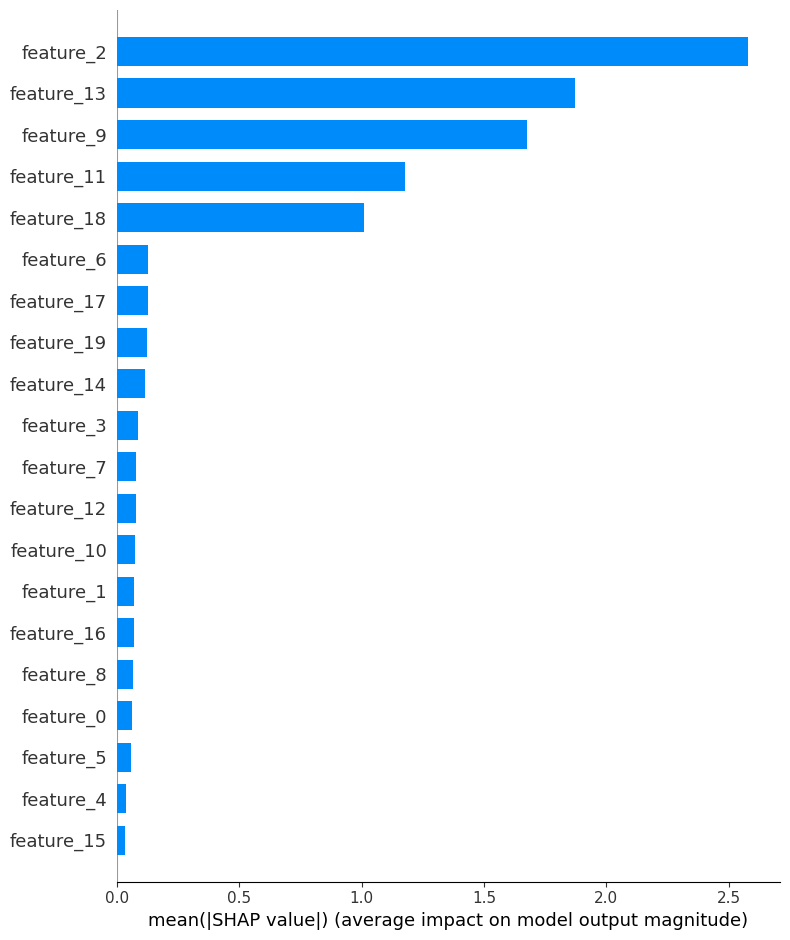

In [31]:
shap.summary_plot(shap_values, X_display, plot_type="bar")

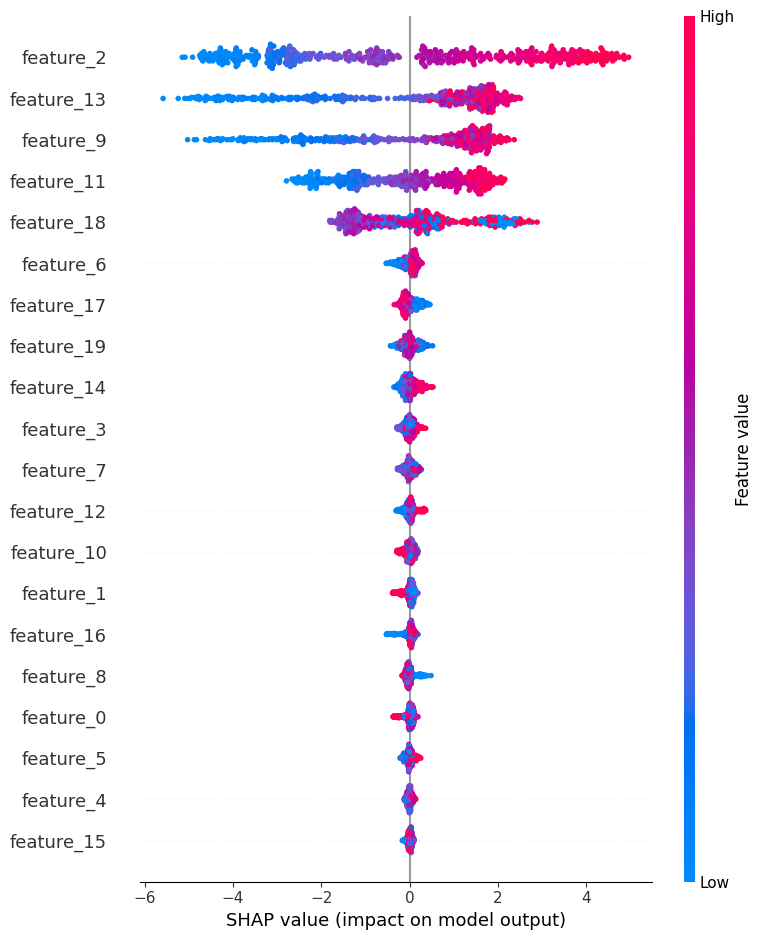

In [32]:
shap.summary_plot(shap_values, X_display)

- The top 5 features (2, 13, 9, 11, 18) show wide value distributions and strong impacts on the model output (During the EDA we saw that feature 2 and target were the varaiables with the largest linear relation.)
- Features like 15, 4, 5 at the bottom show more concentrated distributions around 0, indicating less overall impact
- Features 2, low values consistently decrease predictions while high values increase them.
- Features 13, 9, 11 display inverse directionality compared to feature 2

The following plots show how much context matters for a feature (or in other words how much interaction terms matter). How much interaction terms effect the importance of a feature is captured by the vertical dispersion of the data points. 

For example, take the second plot, for feature 13, values around 125 may increment the value for feature 9 by 10 for some and by 3 for some others, this is beacuse other features of these subjects effect how much the feature the feature 13 matters for feature 9. 

also, the vertical  spread narrows once the feature 13 reaches at least 75, meaning the context of other features matters less for high values of feature 13 than for low values. 

The color the datapoints are given by another feature that most explains the interaction effect variance. For example, low values of feature 13 are less bad if you have lower values for feature 9, but it is really bad if you also have high values.

The y-axis in the plots below represents the SHAP value for that feature, so -4 means observing that feature lowers your log odds of winning by 4, while a value of +2 means observing that feature raises your log odds of winning by 2.

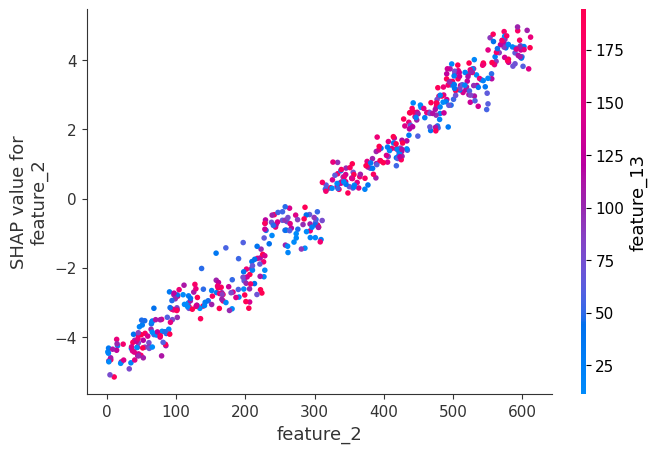

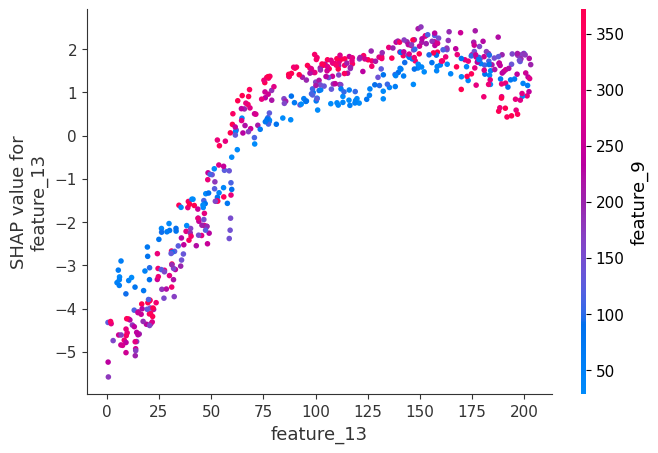

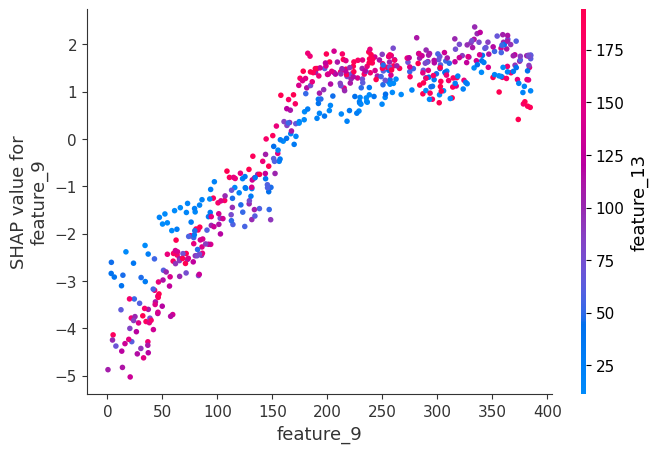

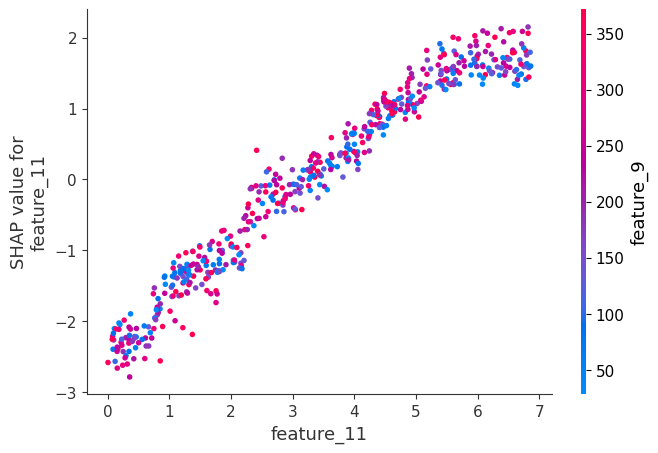

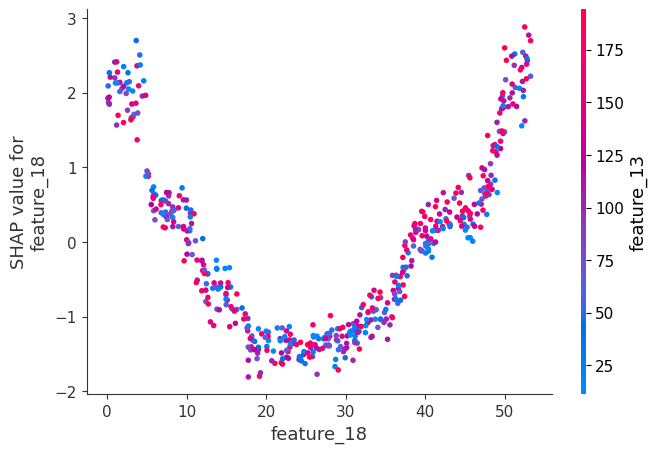

In [ ]:
# Interactions
# sort the features indexes by their importance in the model
top_inds = np.argsort(-np.sum(np.abs(shap_values), 0))

# plot the top 5 interactions
for i in range(5): 
    shap.dependence_plot(top_inds[i], shap_values, X_display)

In [ ]:
shap_analysis = enhanced_shap_analysis(model_final, X_display, shap_values)

In [37]:
shap_analysis['importance_stats']

,feature,mean_abs_shap,std_shap,max_impact
2,feature_2,2.580211,2.910121,5.147075
13,feature_13,1.869931,2.172634,5.582335
9,feature_9,1.675387,1.911065,5.026682
11,feature_11,1.177176,1.355169,2.787539
18,feature_18,1.009847,1.207557,2.885128
6,feature_6,0.127952,0.158489,0.531880
17,feature_17,0.127683,0.154868,0.459615
19,feature_19,0.122639,0.158825,0.517822
14,feature_14,0.115728,0.149961,0.529624
3,feature_3,0.085630,0.108555,0.361648


# Predictions on blind test

In [45]:
blind_test = pd.read_csv(TEST_PATH)
dblind = xgb.DMatrix(blind_test)

predictions = model_final.predict(dblind)

In [48]:
df_results = pd.DataFrame(data=predictions, columns=['target_pred'])

df_results.to_csv(os.path.join(MAIN_DIR, 'target_pred.csv'), index=False)